In [2]:
#importing necessary libraries
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
import scipy.stats as stats
import matplotlib.pyplot as plt
from mlxtend.frequent_patterns import apriori
from mlxtend.frequent_patterns import association_rules



In [3]:
df = pd.read_csv(r"C:\Users\chera\INFO 5906 Data\FAERS_ASTHMA\Data\ASTHMA_Data_Result/ASTHMAFinal/ASTHMA_norm_data.csv", low_memory=False)


In [4]:
df

,primaryid,caseid,drugname,pt,UMLS_pt,UMLS_drugname
0,67928046,6792804,omalizumab,Anaphylactic reaction,anaphylaxis,omalizumab
1,67928046,6792804,omalizumab,Dizziness,Dizziness,omalizumab
2,67928046,6792804,omalizumab,Hyperhidrosis,Hyperhidrosis disorder,omalizumab
3,67928046,6792804,omalizumab,Palpitations,Palpitations,omalizumab
4,71671609,7167160,omalizumab,Asthma,Asthma,omalizumab
...,...,...,...,...,...,...
532895,986902730,9869027,xolair,Diarrhoea,Diarrhea,Xolair
532896,986902730,9869027,xolair,Pharyngeal swelling,Pharyngeal swelling,Xolair
532897,986902730,9869027,xolair,Obstructive airways disorder,"Lung Diseases, Obstructive",Xolair
532898,986902730,9869027,xolair,Pain,Pain,Xolair


In [5]:
drugname_counts = df['UMLS_drugname'].value_counts().head(10)
print(drugname_counts)


Xolair                                                                                                250444
Dupixent                                                                                               51173
mepolizumab                                                                                            43456
Nucala                                                                                                 25924
Symbicort                                                                                              25507
albuterol sulfate                                                                                      24142
Fasenra                                                                                                15584
albuterol                                                                                              12995
montelukast                                                                                            11633
14 ACTUAT fluticaso

In [6]:
df['UMLS_pt'].value_counts()


Asthma                                      24222
Dyspnea                                     18538
Coughing                                    11023
Wheezing                                     9721
Drug ineffective                             8422
                                            ...  
Myocardial necrosis                             1
Wound infection bacterial                       1
Stomatocytes present                            1
Urine albumin/creatinine ratio increased        1
Dactylitis                                      1
Name: UMLS_pt, Length: 6043, dtype: int64

In [7]:
# group the dataframe by UMLS_drugname
grouped = df.groupby('UMLS_drugname')

# find the most frequent UMLS_pt for each group and count their occurrences
most_frequent = grouped['UMLS_pt'].agg(lambda x: x.value_counts().index[0]).to_frame('most_frequent_UMLS_pt')
most_frequent_counts = grouped['UMLS_pt'].agg(lambda x: x.value_counts().iloc[0]).to_frame('count_most_frequent_UMLS_pt')
drugname_counts = grouped.size().to_frame('count_UMLS_drugname')

# combine the results into a single dataframe
result = pd.concat([most_frequent, most_frequent_counts, drugname_counts], axis=1).reset_index()
result = result[['UMLS_drugname', 'most_frequent_UMLS_pt', 'count_most_frequent_UMLS_pt', 'count_UMLS_drugname']]

# sort the dataframe by count_UMLS_drugname in descending order
result = result.sort_values(by='count_UMLS_drugname', ascending=False)

# print the result
print(result)


                      UMLS_drugname  \
74                           Xolair   
30                         Dupixent   
138                     mepolizumab   
56                           Nucala   
66                        Symbicort   
..                              ...   
72                          Xarelto   
139              mepolizumab 100 MG   
192                        tramadol   
107  dexamethasone sodium phosphate   
77                        Zantac 75   

                          most_frequent_UMLS_pt  count_most_frequent_UMLS_pt  \
74                                       Asthma                         8801   
30                            Product use issue                         5032   
138                                      Asthma                         2651   
56                                      Dyspnea                         1039   
66                                      Dyspnea                         1261   
..                                          ...    

In [8]:
# select the drug and adverse event of interest
drug = "Dupixent"
pt = "Product use issue"

# count the number of cases where the drug and adverse event are reported together
numerator = ((df['UMLS_drugname'] == drug) & (df['UMLS_pt'] == pt)).sum()

# count the number of cases where the drug is reported, but the adverse event is not
denominator1 = (df['UMLS_drugname'] == drug).sum() - numerator

# count the number of cases where the adverse event is reported, but the drug is not
denominator2 = (df['UMLS_pt'] == pt).sum() - numerator

# calculate the PRR
prr = (numerator * df.shape[0]) / (denominator1 * denominator2)

print(f"The PRR for {drug} and {pt} is {prr:.2f}")


The PRR for Dupixent and Product use issue is 66.27


In [97]:
# select the drug and adverse event of interest
drug = "Nucala"
pt = "Dyspnea"

# count the number of cases where the drug and adverse event are reported together
numerator = ((df['UMLS_drugname'] == drug) & (df['UMLS_pt'] == pt)).sum()

# count the number of cases where the drug is reported, but the adverse event is not
denominator1 = (df['UMLS_drugname'] == drug).sum() - numerator

# count the number of cases where the adverse event is reported, but the drug is not
denominator2 = (df['UMLS_pt'] == pt).sum() - numerator

# calculate the PRR
prr = (numerator * df.shape[0]) / (denominator1 * denominator2)

print(f"The PRR for {drug} and {pt} is {prr:.2f}")


The PRR for Nucala and Dyspnea is 1.27


In [98]:
# select the drug and adverse event of interest
drug = "Symbicort"
pt = "Dyspnea"

# count the number of cases where the drug and adverse event are reported together
numerator = ((df['UMLS_drugname'] == drug) & (df['UMLS_pt'] == pt)).sum()

# count the number of cases where the drug is reported, but the adverse event is not
denominator1 = (df['UMLS_drugname'] == drug).sum() - numerator

# count the number of cases where the adverse event is reported, but the drug is not
denominator2 = (df['UMLS_pt'] == pt).sum() - numerator

# calculate the PRR
prr = (numerator * df.shape[0]) / (denominator1 * denominator2)

print(f"The PRR for {drug} and {pt} is {prr:.2f}")


The PRR for Symbicort and Dyspnea is 1.60


In [99]:
# select the drug and adverse event of interest
drug = "montelukast"
pt = "Anxiety"

# count the number of cases where the drug and adverse event are reported together
numerator = ((df['UMLS_drugname'] == drug) & (df['UMLS_pt'] == pt)).sum()

# count the number of cases where the drug is reported, but the adverse event is not
denominator1 = (df['UMLS_drugname'] == drug).sum() - numerator

# count the number of cases where the adverse event is reported, but the drug is not
denominator2 = (df['UMLS_pt'] == pt).sum() - numerator

# calculate the PRR
prr = (numerator * df.shape[0]) / (denominator1 * denominator2)

print(f"The PRR for {drug} and {pt} is {prr:.2f}")


The PRR for montelukast and Anxiety is 10.88


In [100]:
# select the drug and adverse event of interest
drug = "14 ACTUAT fluticasone furoate 0.1 MG/ACTUAT / vilanterol 0.025 MG/ACTUAT Dry Powder Inhaler [Breo]"
pt = "Drug ineffective"

# count the number of cases where the drug and adverse event are reported together
numerator = ((df['UMLS_drugname'] == drug) & (df['UMLS_pt'] == pt)).sum()

# count the number of cases where the drug is reported, but the adverse event is not
denominator1 = (df['UMLS_drugname'] == drug).sum() - numerator

# count the number of cases where the adverse event is reported, but the drug is not
denominator2 = (df['UMLS_pt'] == pt).sum() - numerator

# calculate the PRR
prr = (numerator * df.shape[0]) / (denominator1 * denominator2)

print(f"The PRR for {drug} and {pt} is {prr:.2f}")


The PRR for 14 ACTUAT fluticasone furoate 0.1 MG/ACTUAT / vilanterol 0.025 MG/ACTUAT Dry Powder Inhaler [Breo] and Drug ineffective is 4.12


In [101]:
# select the drug and adverse event of interest
drug = "NDA020983 200 ACTUAT albuterol 0.09 MG/ACTUAT Metered Dose Inhaler [Ventolin]"
pt = "Wrong technique in product usage process"

# count the number of cases where the drug and adverse event are reported together
numerator = ((df['UMLS_drugname'] == drug) & (df['UMLS_pt'] == pt)).sum()

# count the number of cases where the drug is reported, but the adverse event is not
denominator1 = (df['UMLS_drugname'] == drug).sum() - numerator

# count the number of cases where the adverse event is reported, but the drug is not
denominator2 = (df['UMLS_pt'] == pt).sum() - numerator

# calculate the PRR
prr = (numerator * df.shape[0]) / (denominator1 * denominator2)

print(f"The PRR for {drug} and {pt} is {prr:.2f}")


The PRR for NDA020983 200 ACTUAT albuterol 0.09 MG/ACTUAT Metered Dose Inhaler [Ventolin] and Wrong technique in product usage process is 35.69


In [102]:
# select the drug and adverse event of interest
drug = "Singulair"
pt = "Anxiety"

# count the number of cases where the drug and adverse event are reported together
numerator = ((df['UMLS_drugname'] == drug) & (df['UMLS_pt'] == pt)).sum()

# count the number of cases where the drug is reported, but the adverse event is not
denominator1 = (df['UMLS_drugname'] == drug).sum() - numerator

# count the number of cases where the adverse event is reported, but the drug is not
denominator2 = (df['UMLS_pt'] == pt).sum() - numerator

# calculate the PRR
prr = (numerator * df.shape[0]) / (denominator1 * denominator2)

print(f"The PRR for {drug} and {pt} is {prr:.2f}")


The PRR for Singulair and Anxiety is 6.16


In [103]:
# select the drug and adverse event of interest
drug = "Dulera"
pt = "Product quality issue"

# count the number of cases where the drug and adverse event are reported together
numerator = ((df['UMLS_drugname'] == drug) & (df['UMLS_pt'] == pt)).sum()

# count the number of cases where the drug is reported, but the adverse event is not
denominator1 = (df['UMLS_drugname'] == drug).sum() - numerator

# count the number of cases where the adverse event is reported, but the drug is not
denominator2 = (df['UMLS_pt'] == pt).sum() - numerator

# calculate the PRR
prr = (numerator * df.shape[0]) / (denominator1 * denominator2)

print(f"The PRR for {drug} and {pt} is {prr:.2f}")


The PRR for Dulera and Product quality issue is 62.37


In [16]:
baskets = []
num = 1
temp_basket = []
last_line = False
for index, row in df.iterrows():
    ## check whether the new row is from the same patient or not
    ## If it is the same patient, the new row will be put into the same basket
    ## If not, create a new basket.
    if num == 1:
        previous_id = row["caseid"]
        current_id = row["caseid"]
        first_line = True
    elif num == df.shape[0]:
        last_line = True
        first_line = False
        previous_id = current_id
        current_id = row["caseid"]
    else:
        first_line = False
        previous_id = current_id
        current_id = row["caseid"]
    ## if the new row is from the same patient, only add the adverse drug reaction
    if previous_id == current_id :
        same_patient = True
    else:
        same_patient = False
    if same_patient:
        temp_basket.append(row["UMLS_pt"])
        if first_line:
            temp_basket.append(row["UMLS_drugname"])
    else:
        baskets.append(temp_basket)
        temp_basket = []
        temp_basket.append(row["UMLS_drugname"])
        temp_basket.append(row["UMLS_pt"])
    if last_line:
        baskets.append(temp_basket)
    num += 1
    

In [17]:
len(baskets)

96946

In [18]:
baskets[1]

['omalizumab',
 'Asthma',
 'Hypotension',
 'Dyspnea',
 'Increased upper airway secretion',
 'Infectious Lung Disorder',
 'Musculoskeletal Pain',
 'Nasal congestion (finding)',
 'Nasal Polyps',
 'Nasopharyngitis',
 'Neck Pain',
 'Productive Cough',
 'Rales',
 'Wheezing']

In [19]:
items = list()
for basket in baskets:
    items.extend(basket)
print(set(items))
print(len(set(items)))


{'Intrathecal pump insertion', 'Coagulation factor deficiency syndrome', 'Product physical issue', 'Radioallergosorbent test positive', 'Myeloproliferative disease', 'Dermatologic disorders', 'Dark circles under eyes', 'Reaction to drug excipients', 'Dissociation', 'Traumatic injury', 'Phonophobia', 'Osteoporosis', 'levalbuterol 0.21 MG/ML Inhalation Solution', 'Hemorrhage of kidney', 'Low birth weight baby', 'Oropharyngeal Carcinoma', 'Doppler Ultrasound (procedure)', 'Cervix Diseases', 'Anion gap abnormal', 'INR Increased', 'Thermal burns of eye', 'Hypertrophy of parotid gland', 'Autophobia', 'Blood pressure orthostatic decreased', 'Hypomagnesemia', 'Retinal Artery Occlusion', 'Suspected product tampering', 'Neuralgia', 'Viral exanthem', 'Neoplasm Metastasis', 'Lipids abnormal', 'Neurotic Disorders', 'Fallopian Tube Carcinoma', 'Dermatomyositis', 'Neonatal Jaundice', 'Decreased peak expiratory flow rate', 'Lower respiratory tract infection', 'Foaming at mouth', 'Cerebral mass effect'

In [20]:
# Create empty list to contain the converted data
converted_vals = []
for row in baskets:
    labels = {}
    # Find items that do not occur in the transaction
    not_occurred = list(set(items) - set(row))
    # Find items that occur in the transaction
    occurred = list(set(items).intersection(row))
    for nc in not_occurred:
        labels[nc] = 0
    for occ in occurred:
        labels[occ] = 1
    converted_vals.append(labels)

converted_basket = pd.DataFrame(converted_vals)
print(converted_basket.head())

   Intrathecal pump insertion  Abscess of vulva  \
0                           0                 0   
1                           0                 0   
2                           0                 0   
3                           0                 0   
4                           0                 0   

   Coagulation factor deficiency syndrome  \
0                                       0   
1                                       0   
2                                       0   
3                                       0   
4                                       0   

   Drug effective for unapproved indication  Product physical issue  \
0                                         0                       0   
1                                         0                       0   
2                                         0                       0   
3                                         0                       0   
4                                         0                       0

In [21]:
frequent_itemsets = apriori(converted_basket, min_support=0.05, use_colnames=True)

print(frequent_itemsets)

C:\Users\chera\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlxtend\frequent_patterns\fpcommon.py:111: DeprecationWarning: DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type
  warnings.warn(


     support                       itemsets
0   0.254987                       (Xolair)
1   0.100241                     (Wheezing)
2   0.077435                      (Malaise)
3   0.086863             (Drug ineffective)
4   0.202288                     (Dupixent)
5   0.190849                      (Dyspnea)
6   0.064964                     (Headache)
7   0.249221                       (Asthma)
8   0.052266                    (Symbicort)
9   0.060838            (Product use issue)
10  0.063654                       (Nucala)
11  0.113599                     (Coughing)
12  0.069730                    (Pneumonia)
13  0.063819              (Nasopharyngitis)
14  0.069977                      (Fatigue)
15  0.054360                      (Fasenra)
16  0.094692                  (mepolizumab)
17  0.071050              (Xolair, Dyspnea)
18  0.090638               (Xolair, Asthma)
19  0.057506             (Xolair, Coughing)
20  0.069833            (Dyspnea, Wheezing)
21  0.069441             (Asthma

In [22]:
rules = association_rules(frequent_itemsets, metric="lift", min_threshold=1)
print(rules)

            antecedents          consequents  antecedent support  \
0              (Xolair)            (Dyspnea)            0.254987   
1             (Dyspnea)             (Xolair)            0.190849   
2              (Xolair)             (Asthma)            0.254987   
3              (Asthma)             (Xolair)            0.249221   
4              (Xolair)           (Coughing)            0.254987   
5            (Coughing)             (Xolair)            0.113599   
6             (Dyspnea)           (Wheezing)            0.190849   
7            (Wheezing)            (Dyspnea)            0.100241   
8              (Asthma)           (Wheezing)            0.249221   
9            (Wheezing)             (Asthma)            0.100241   
10           (Dupixent)  (Product use issue)            0.202288   
11  (Product use issue)           (Dupixent)            0.060838   
12            (Dyspnea)             (Asthma)            0.190849   
13             (Asthma)            (Dyspnea)    

In [23]:
rules[ (rules['lift'] >= 1) & (rules['confidence'] >= 0.3) ].sort_values(by=['lift'], ascending=False)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
23,(Wheezing),"(Dyspnea, Asthma)",0.100241,0.097642,0.056557,0.564211,5.778362,0.046769,2.070629
18,"(Dyspnea, Asthma)",(Wheezing),0.097642,0.100241,0.056557,0.579231,5.778362,0.046769,2.138367
20,"(Asthma, Wheezing)",(Dyspnea),0.069441,0.190849,0.056557,0.814468,4.267616,0.043305,4.361255
11,(Product use issue),(Dupixent),0.060838,0.202288,0.051812,0.851645,4.210063,0.039506,5.377036
6,(Dyspnea),(Wheezing),0.190849,0.100241,0.069833,0.365906,3.650253,0.050702,1.418968
7,(Wheezing),(Dyspnea),0.100241,0.190849,0.069833,0.696645,3.650253,0.050702,2.667345
19,"(Dyspnea, Wheezing)",(Asthma),0.069833,0.249221,0.056557,0.809897,3.249710,0.039153,3.949318
14,(Dyspnea),(Coughing),0.190849,0.113599,0.061395,0.321695,2.831839,0.039715,1.306788
15,(Coughing),(Dyspnea),0.113599,0.190849,0.061395,0.540452,2.831839,0.039715,1.760756
9,(Wheezing),(Asthma),0.100241,0.249221,0.069441,0.692735,2.779599,0.044458,2.443425


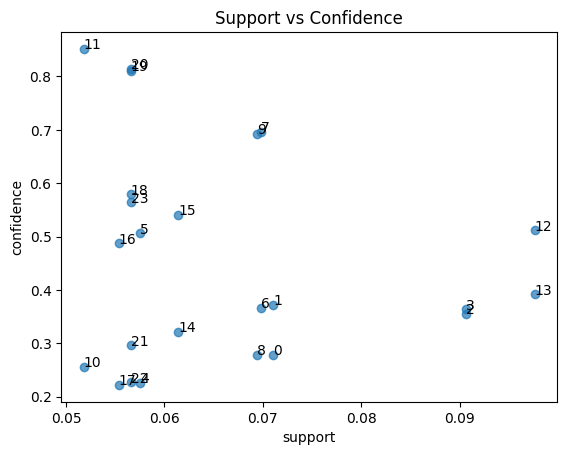

In [24]:
plt.scatter(rules['support'], rules['confidence'], alpha=0.7)
for i in range(rules.shape[0]):
    plt.text(rules.loc[i,"support"], rules.loc[i,"confidence"], str(i))
plt.xlabel('support')
plt.ylabel('confidence')
plt.title('Support vs Confidence')
plt.show()

In [25]:
# group the data by 'Suspect Product Names' and count the number of occurrences
count_df = df.groupby('UMLS_drugname').size().reset_index(name='Count')

# sort the data by 'Count' in descending order
sorted_df = count_df.sort_values(by='Count', ascending=False)

# print the top 10 results
print(sorted_df.head(10))

                                         UMLS_drugname   Count
74                                              Xolair  250444
30                                            Dupixent   51173
138                                        mepolizumab   43456
56                                              Nucala   25924
66                                           Symbicort   25507
88                                   albuterol sulfate   24142
34                                             Fasenra   15584
80                                           albuterol   12995
151                                        montelukast   11633
7    14 ACTUAT fluticasone furoate 0.1 MG/ACTUAT / ...    7751


In [26]:
import nltk
nltk.download('punkt')

from nltk.tokenize import word_tokenize
from nltk.probability import FreqDist
from nltk.tokenize import RegexpTokenizer
from nltk.corpus import stopwords
from collections import Counter

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\chera\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


# Selecting all drugnames and variations to look at adverse reactions and get their counts# Selecting all drugnames and variations to look at adverse reactions and get their counts

# Dupixent

In [40]:
# create a list of drug names to filter for
drug_names = ["Dupixent"]

# filter rows where 'drugname' is in the list of drug names
drugname_df = df[df['UMLS_drugname'].isin(drug_names)]

# extract words from 'Reactions' column and tokenize them
reactions = drugname_df['UMLS_pt'].str.lower().str.cat(sep=' ')
tokens = word_tokenize(reactions)

# remove stop words and punctuation
stop_words = set(nltk.corpus.stopwords.words('english'))
tokens = [token for token in tokens if token.isalnum() and token not in stop_words]

# calculate word frequency distribution
fdist = FreqDist(tokens)

# print the top 10 most frequent words
print(fdist.most_common(10))


[('product', 8453), ('issue', 6501), ('use', 5974), ('site', 3911), ('injection', 3891), ('pain', 2772), ('asthma', 2607), ('dose', 2262), ('omission', 1748), ('drug', 1701)]


In [41]:
tokenizer = RegexpTokenizer(r'\w+')
drugname_df['tokens'] = drugname_df['UMLS_pt'].apply(lambda x: tokenizer.tokenize(x.lower()))


In [42]:
stop_words = set(stopwords.words('english'))
drugname_df['tokens'] = drugname_df['tokens'].apply(lambda x: [word for word in x if word not in stop_words])


In [43]:
fdist = FreqDist([word for tokens in drugname_df['tokens'] for word in tokens])
sorted_words = sorted(fdist.items(), key=lambda x: x[1], reverse=True)


In [44]:
for word, frequency in sorted_words[:10]:
    print(f"{word}: {frequency}")


product: 8453
issue: 6501
use: 5974
site: 3911
injection: 3891
pain: 2772
asthma: 2609
dose: 2262
omission: 1748
drug: 1703


In [45]:
for index, row in drugname_df.iterrows():
    fdist = FreqDist(row['tokens'])
    sorted_words = sorted(fdist.items(), key=lambda x: x[1], reverse=True)
    print(f"Row {index}:")
    for word, frequency in sorted_words[:10]:
        print(f"{word}: {frequency}")


Row 120896:
eczema: 1
Row 120897:
product: 1
use: 1
unapproved: 1
indication: 1
Row 131917:
dermatitis: 1
atopic: 1
Row 131918:
erythema: 1
Row 131919:
papule: 1
Row 131920:
product: 1
use: 1
unapproved: 1
indication: 1
Row 145338:
asthma: 1
Row 145339:
dyspnea: 1
Row 145340:
product: 1
use: 1
unapproved: 1
indication: 1
Row 145341:
rhinovirus: 1
infection: 1
Row 145342:
therapeutic: 1
response: 1
unexpected: 1
Row 145343:
virus: 1
diseases: 1
Row 146098:
glaucoma: 1
Row 146099:
ocular: 1
hypertension: 1
Row 147442:
discomfort: 1
Row 147443:
label: 1
treatment: 1
Row 147444:
exanthema: 1
Row 147445:
hernia: 1
inguinal: 1
Row 153178:
dermatologic: 1
disorders: 1
Row 171077:
ocular: 1
hyperemia: 1
Row 185203:
nausea: 1
Row 186885:
product: 1
dose: 1
omission: 1
Row 186886:
product: 1
use: 1
unapproved: 1
indication: 1
Row 186887:
exanthema: 1
Row 187475:
drug: 1
ineffective: 1
Row 187932:
itching: 1
eye: 1
Row 187933:
hyperleukocytosis: 1
Row 187934:
pruritus: 1
Row 187935:
skin: 1
lesio

In [46]:
# create a new column to store the tokenized reactions
drugname_df['Reactions_Tokenized'] = drugname_df['UMLS_pt'].str.lower().str.split('[,;]')

# initialize a dictionary to store the word frequencies
word_freq = {}

# loop through each row of the dataframe
for row in drugname_df.itertuples():
    # loop through each tokenized word in the row
    for word in row.Reactions_Tokenized:
        # ignore stop words and single character words
        if word not in set(stopwords.words('english')) and len(word) > 1:
            # increment the word frequency count in the dictionary
            word_freq[word] = word_freq.get(word, 0) + 1

# sort the dictionary by the word frequency in descending order
sorted_word_freq = sorted(word_freq.items(), key=lambda x: x[1], reverse=True)

# print the top 10 most frequent words
for word, freq in sorted_word_freq[:1000]:
    print(f'{word}: {freq}')


product use issue: 5032
asthma: 2606
drug ineffective: 1380
product dose omission issue: 1311
impaired quality of life: 1176
dyspnea: 1165
injection site pain: 1025
exanthema: 928
coughing: 913
product use in unapproved indication: 892
arthralgia: 877
covid19 (disease): 715
headache: 632
pruritus: 629
disease exacerbation: 539
erythema at injection site: 538
fatigue: 512
pain: 440
hospitalization: 438
wheezing: 404
incorrect dose administered: 404
swelling at injection site: 388
unevaluable event: 345
pneumonia: 341
injection site reaction: 335
injection site dermatitis: 317
injection site itching: 316
dryness of eye: 312
chest discomfort: 310
blurred vision: 299
off-label treatment: 285
hypersensitivity: 285
malaise: 285
fever: 284
nausea: 271
itching of eye: 267
dizziness: 267
sinusitis: 263
illness (finding): 260
inappropriate schedule of product administration: 248
decreased therapeutic response: 245
urticaria: 241
nasopharyngitis: 239
injection site bruising: 234
erythema: 231
wei

In [49]:
# create a dataframe from the sorted_word_freq list
Dupixent_df = pd.DataFrame(sorted_word_freq, columns=['word', 'freq'])

# save the dataframe as a CSV file
Dupixent_df.to_csv('Dupixent_df_word_freq1.csv', index=False)

# print the top 10 most frequent words
print(Dupixent_df.head(10))

                                   word  freq
0                     product use issue  5032
1                                asthma  2606
2                      drug ineffective  1380
3           product dose omission issue  1311
4              impaired quality of life  1176
5                               dyspnea  1165
6                   injection site pain  1025
7                             exanthema   928
8                              coughing   913
9  product use in unapproved indication   892


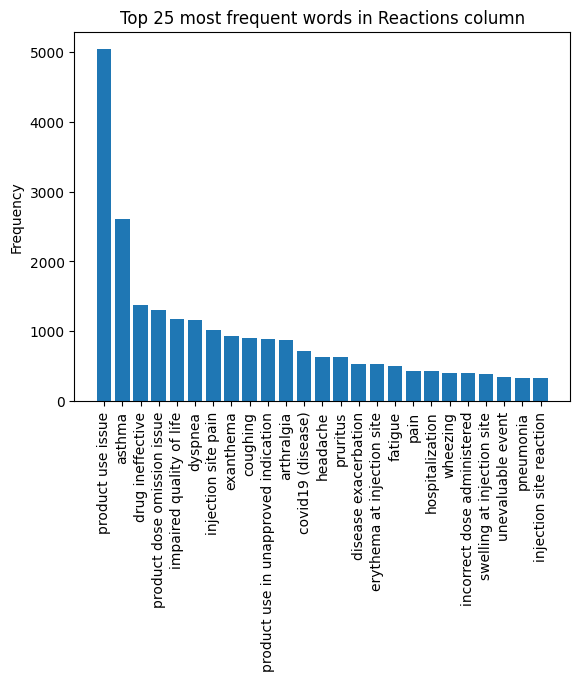

<Figure size 640x480 with 0 Axes>

In [50]:
# create a list of words from the 'Reactions' column
reactions = drugname_df['UMLS_pt'].str.lower().str.cat(sep=',')

# split the reactions by comma and semi-colon
words = reactions.split(',') + [x.strip() for x in reactions.split(';')]

# count the frequency of each word
word_counts = Counter(words)

# create a list of the top 100 words and their counts
top_words = word_counts.most_common(25)

# create a bar chart
plt.bar([x[0] for x in top_words], [x[1] for x in top_words])
plt.xticks(rotation=90)
plt.ylabel('Frequency')
plt.title('Top 25 most frequent words in Reactions column')
plt.show()
plt.savefig('top_25_reactions.png')


# Nucala

In [104]:
# create a list of drug names to filter for
drug_names = ["Nucala"]

# filter rows where 'drugname' is in the list of drug names
drugname_df = df[df['UMLS_drugname'].isin(drug_names)]

# extract words from 'Reactions' column and tokenize them
reactions = drugname_df['UMLS_pt'].str.lower().str.cat(sep=' ')
tokens = word_tokenize(reactions)

# remove stop words and punctuation
stop_words = set(nltk.corpus.stopwords.words('english'))
tokens = [token for token in tokens if token.isalnum() and token not in stop_words]

# calculate word frequency distribution
fdist = FreqDist(tokens)

# print the top 10 most frequent words
print(fdist.most_common(10))


[('product', 2527), ('pain', 1376), ('dose', 1202), ('omission', 1091), ('dyspnea', 1088), ('issue', 989), ('drug', 929), ('disease', 835), ('asthma', 760), ('status', 599)]


In [105]:
tokenizer = RegexpTokenizer(r'\w+')
drugname_df['tokens'] = drugname_df['UMLS_pt'].apply(lambda x: tokenizer.tokenize(x.lower()))


In [106]:
stop_words = set(stopwords.words('english'))
drugname_df['tokens'] = drugname_df['tokens'].apply(lambda x: [word for word in x if word not in stop_words])


In [107]:
fdist = FreqDist([word for tokens in drugname_df['tokens'] for word in tokens])
sorted_words = sorted(fdist.items(), key=lambda x: x[1], reverse=True)


In [108]:
for word, frequency in sorted_words[:10]:
    print(f"{word}: {frequency}")


product: 2527
pain: 1376
dose: 1202
omission: 1091
dyspnea: 1088
issue: 989
drug: 938
disease: 837
asthma: 760
status: 599


In [109]:
for index, row in drugname_df.iterrows():
    fdist = FreqDist(row['tokens'])
    sorted_words = sorted(fdist.items(), key=lambda x: x[1], reverse=True)
    print(f"Row {index}:")
    for word, frequency in sorted_words[:10]:
        print(f"{word}: {frequency}")


Row 54262:
headache: 1
Row 54263:
urticaria: 1
Row 55992:
chest: 1
discomfort: 1
Row 55993:
dizziness: 1
Row 55994:
emergency: 1
care: 1
Row 55995:
erythema: 1
Row 55996:
fatigue: 1
Row 55997:
flushing: 1
Row 55998:
headache: 1
Row 55999:
hospitalization: 1
Row 56000:
paresthesia: 1
Row 56001:
oral: 1
paresthesia: 1
Row 56075:
back: 1
pain: 1
Row 56076:
diarrhea: 1
Row 56077:
headache: 1
Row 56078:
nausea: 1
Row 56124:
nonspecific: 1
reaction: 1
Row 56125:
pain: 1
skin: 1
Row 56126:
generalized: 1
pruritus: 1
Row 56127:
burning: 1
sensation: 1
skin: 1
Row 56261:
dermatitis: 1
Row 56262:
fixed: 1
drug: 1
eruption: 1
Row 56263:
erythematous: 1
rash: 1
Row 56287:
white: 1
blood: 1
cell: 1
count: 1
increased: 1
lab: 1
result: 1
Row 61507:
anaphylactic: 1
shock: 1
Row 61508:
asthma: 1
Row 61509:
bronchospasm: 1
Row 61510:
dyspnea: 1
Row 61511:
reaction: 1
drug: 1
excipients: 1
Row 61512:
stridor: 1
Row 61513:
wheezing: 1
Row 61638:
anaphylaxis: 1
Row 61639:
anaphylactoid: 1
reaction: 1
Row 

In [110]:
# create a new column to store the tokenized reactions
drugname_df['Reactions_Tokenized'] = drugname_df['UMLS_pt'].str.lower().str.split('[,;]')

# initialize a dictionary to store the word frequencies
word_freq = {}

# loop through each row of the dataframe
for row in drugname_df.itertuples():
    # loop through each tokenized word in the row
    for word in row.Reactions_Tokenized:
        # ignore stop words and single character words
        if word not in set(stopwords.words('english')) and len(word) > 1:
            # increment the word frequency count in the dictionary
            word_freq[word] = word_freq.get(word, 0) + 1

# sort the dictionary by the word frequency in descending order
sorted_word_freq = sorted(word_freq.items(), key=lambda x: x[1], reverse=True)

# print the top 10 most frequent words
for word, freq in sorted_word_freq[:1000]:
    print(f'{word}: {freq}')


dyspnea: 1039
asthma: 760
product dose omission issue: 689
status asthmaticus: 594
coughing: 588
fatigue: 577
drug ineffective: 576
headache: 504
malaise: 477
inappropriate schedule of product administration: 382
wheezing: 372
pneumonia: 364
disease exacerbation: 297
product complaint: 275
product dose omission: 274
pain: 262
back pain: 254
fever: 239
death (finding): 235
exposure via skin contact: 235
exanthema: 213
arthralgia: 213
wrong technique in device usage process: 211
accidental exposure to product: 206
injection site pain: 198
pruritus: 189
covid19 (disease): 187
dizziness: 184
chest discomfort: 170
hospitalization: 169
productive cough: 165
asthenia: 155
product availability issue: 151
nausea: 148
influenza: 145
herpes zoster disease: 142
hypersensitivity: 141
sinusitis: 141
pain in limb: 141
myalgia: 135
nasopharyngitis: 135
urticaria: 127
nasal congestion (finding): 121
chest pain: 119
product use in unapproved indication: 118
drug dose omission: 115
underdose (unintention

In [111]:
# create a dataframe from the sorted_word_freq list
montelukast_df = pd.DataFrame(sorted_word_freq, columns=['word', 'freq'])

# save the dataframe as a CSV file
montelukast_df.to_csv('montelukast_word_freq.csv', index=False)

# print the top 10 most frequent words
print(montelukast_df.head(10))

                                               word  freq
0                                           dyspnea  1039
1                                            asthma   760
2                       product dose omission issue   689
3                                status asthmaticus   594
4                                          coughing   588
5                                           fatigue   577
6                                  drug ineffective   576
7                                          headache   504
8                                           malaise   477
9  inappropriate schedule of product administration   382


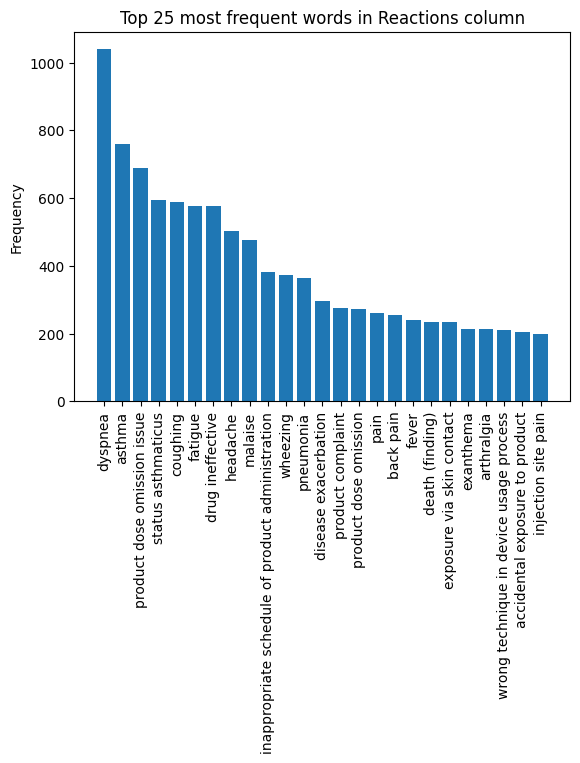

<Figure size 640x480 with 0 Axes>

In [112]:
# create a list of words from the 'Reactions' column
reactions = drugname_df['UMLS_pt'].str.lower().str.cat(sep=',')

# split the reactions by comma and semi-colon
words = reactions.split(',') + [x.strip() for x in reactions.split(';')]

# count the frequency of each word
word_counts = Counter(words)

# create a list of the top 100 words and their counts
top_words = word_counts.most_common(25)

# create a bar chart
plt.bar([x[0] for x in top_words], [x[1] for x in top_words])
plt.xticks(rotation=90)
plt.ylabel('Frequency')
plt.title('Top 25 most frequent words in Reactions column')
plt.show()
plt.savefig('top_25_reactions.png')


# Symbicort

In [113]:
# create a list of drug names to filter for
drug_names = ["Symbicort"]

# filter rows where 'drugname' is in the list of drug names
drugname_df = df[df['UMLS_drugname'].isin(drug_names)]

# extract words from 'Reactions' column and tokenize them
reactions = drugname_df['UMLS_pt'].str.lower().str.cat(sep=' ')
tokens = word_tokenize(reactions)

# remove stop words and punctuation
stop_words = set(nltk.corpus.stopwords.words('english'))
tokens = [token for token in tokens if token.isalnum() and token not in stop_words]

# calculate word frequency distribution
fdist = FreqDist(tokens)

# print the top 10 most frequent words
print(fdist.most_common(10))


[('product', 2835), ('device', 2681), ('intentional', 1697), ('misuse', 1605), ('drug', 1491), ('issue', 1448), ('dyspnea', 1321), ('dose', 1269), ('asthma', 1052), ('omission', 1035)]


In [114]:
tokenizer = RegexpTokenizer(r'\w+')
drugname_df['tokens'] = drugname_df['UMLS_pt'].apply(lambda x: tokenizer.tokenize(x.lower()))


In [115]:
stop_words = set(stopwords.words('english'))
drugname_df['tokens'] = drugname_df['tokens'].apply(lambda x: [word for word in x if word not in stop_words])


In [116]:
fdist = FreqDist([word for tokens in drugname_df['tokens'] for word in tokens])
sorted_words = sorted(fdist.items(), key=lambda x: x[1], reverse=True)


In [117]:
for word, frequency in sorted_words[:10]:
    print(f"{word}: {frequency}")


product: 2835
device: 2682
intentional: 1697
misuse: 1605
drug: 1491
issue: 1448
dyspnea: 1321
dose: 1269
asthma: 1055
omission: 1035


In [118]:
for index, row in drugname_df.iterrows():
    fdist = FreqDist(row['tokens'])
    sorted_words = sorted(fdist.items(), key=lambda x: x[1], reverse=True)
    print(f"Row {index}:")
    for word, frequency in sorted_words[:10]:
        print(f"{word}: {frequency}")


Row 59:
asthenia: 1
Row 60:
asthma: 1
Row 61:
bronchitis: 1
Row 62:
chest: 1
discomfort: 1
Row 63:
chronic: 1
fatigue: 1
syndrome: 1
Row 64:
crying: 1
Row 65:
disturbance: 1
attention: 1
Row 66:
dizziness: 1
Row 67:
dysphonia: 1
Row 68:
fatigue: 1
Row 69:
headache: 1
Row 70:
mental: 1
handicap: 1
Row 71:
mood: 1
swings: 1
Row 72:
muscle: 1
weakness: 1
Row 73:
label: 1
treatment: 1
Row 74:
oropharyngeal: 1
pain: 1
Row 75:
weepiness: 1
Row 76:
vertigo: 1
Row 311:
asthma: 1
Row 312:
aura: 1
Row 313:
brain: 1
injuries: 1
Row 314:
congestive: 1
heart: 1
failure: 1
Row 315:
cerebral: 1
hemorrhage: 1
Row 316:
circumstance: 1
information: 1
capable: 1
leading: 1
medication: 1
error: 1
Row 317:
diabetes: 1
mellitus: 1
Row 318:
dizziness: 1
Row 319:
drug: 1
allergy: 1
Row 320:
dyspnea: 1
Row 321:
feeling: 1
abnormal: 1
Row 322:
hemorrhagic: 1
stroke: 1
Row 323:
hallucinations: 1
auditory: 1
Row 324:
headache: 1
Row 325:
hemiparesis: 1
Row 326:
hypertensive: 1
disease: 1
Row 327:
hypothyroidism: 

In [119]:
# create a new column to store the tokenized reactions
drugname_df['Reactions_Tokenized'] = drugname_df['UMLS_pt'].str.lower().str.split('[,;]')

# initialize a dictionary to store the word frequencies
word_freq = {}

# loop through each row of the dataframe
for row in drugname_df.itertuples():
    # loop through each tokenized word in the row
    for word in row.Reactions_Tokenized:
        # ignore stop words and single character words
        if word not in set(stopwords.words('english')) and len(word) > 1:
            # increment the word frequency count in the dictionary
            word_freq[word] = word_freq.get(word, 0) + 1

# sort the dictionary by the word frequency in descending order
sorted_word_freq = sorted(word_freq.items(), key=lambda x: x[1], reverse=True)

# print the top 10 most frequent words
for word, freq in sorted_word_freq[:1000]:
    print(f'{word}: {freq}')


dyspnea: 1261
intentional product misuse: 1099
asthma: 1052
off-label treatment: 804
coughing: 590
device malfunction: 560
drug dose omission: 547
drug ineffective: 475
intentional device misuse: 443
medical device failure or malfunction: 377
wheezing: 341
malaise: 321
product use issue: 316
dysphonia: 297
wrong technique in device usage process: 274
chest discomfort: 270
product quality issue: 259
product dose omission: 219
device use issue: 197
circumstance or information capable of leading to medication error: 196
fatigue: 188
product dose omission issue: 184
feeling abnormal: 183
device failure: 177
headache: 171
device delivery system issue: 170
pneumonia: 162
bronchitis: 159
wrong technique in product usage process: 158
short stature for age: 151
lung diseases: 144
status asthmaticus: 142
nasopharyngitis: 141
dizziness: 139
decreased body weight: 137
incorrect dose administered by device: 134
sleeplessness: 134
hypersensitivity: 133
visual impairment: 133
weight gain: 131
chest p

In [120]:
# create a dataframe from the sorted_word_freq list
fluticasone_df = pd.DataFrame(sorted_word_freq, columns=['word', 'freq'])

# save the dataframe as a CSV file
fluticasone_df.to_csv('fluticasone_df_word_freq.csv', index=False)

# print the top 10 most frequent words
print(fluticasone_df.head(10))

                                    word  freq
0                                dyspnea  1261
1             intentional product misuse  1099
2                                 asthma  1052
3                    off-label treatment   804
4                               coughing   590
5                     device malfunction   560
6                     drug dose omission   547
7                       drug ineffective   475
8              intentional device misuse   443
9  medical device failure or malfunction   377


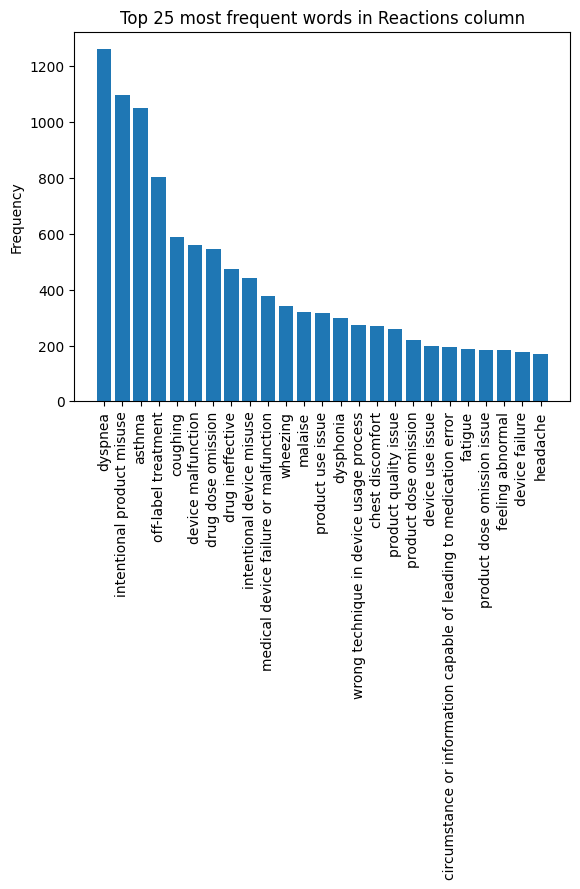

<Figure size 640x480 with 0 Axes>

In [121]:
# create a list of words from the 'Reactions' column
reactions = drugname_df['UMLS_pt'].str.lower().str.cat(sep=',')

# split the reactions by comma and semi-colon
words = reactions.split(',') + [x.strip() for x in reactions.split(';')]

# count the frequency of each word
word_counts = Counter(words)

# create a list of the top 100 words and their counts
top_words = word_counts.most_common(25)

# create a bar chart
plt.bar([x[0] for x in top_words], [x[1] for x in top_words])
plt.xticks(rotation=90)
plt.ylabel('Frequency')
plt.title('Top 25 most frequent words in Reactions column')
plt.show()
plt.savefig('top_25_reactions.png')


# montelukast

In [122]:
# create a list of drug names to filter for
drug_names = ["montelukast"]

# filter rows where 'drugname' is in the list of drug names
drugname_df = df[df['UMLS_drugname'].isin(drug_names)]

# extract words from 'Reactions' column and tokenize them
reactions = drugname_df['UMLS_pt'].str.lower().str.cat(sep=' ')
tokens = word_tokenize(reactions)

# remove stop words and punctuation
stop_words = set(nltk.corpus.stopwords.words('english'))
tokens = [token for token in tokens if token.isalnum() and token not in stop_words]

# calculate word frequency distribution
fdist = FreqDist(tokens)

# print the top 10 most frequent words
print(fdist.most_common(10))


[('anxiety', 584), ('behavior', 517), ('disorder', 384), ('mental', 373), ('mood', 369), ('aggressive', 345), ('disorders', 340), ('finding', 334), ('depression', 320), ('drug', 314)]


In [123]:
tokenizer = RegexpTokenizer(r'\w+')
drugname_df['tokens'] = drugname_df['UMLS_pt'].apply(lambda x: tokenizer.tokenize(x.lower()))


In [124]:
stop_words = set(stopwords.words('english'))
drugname_df['tokens'] = drugname_df['tokens'].apply(lambda x: [word for word in x if word not in stop_words])


In [125]:
fdist = FreqDist([word for tokens in drugname_df['tokens'] for word in tokens])
sorted_words = sorted(fdist.items(), key=lambda x: x[1], reverse=True)


In [126]:
for word, frequency in sorted_words[:10]:
    print(f"{word}: {frequency}")


anxiety: 584
behavior: 517
disorder: 384
mental: 373
mood: 369
aggressive: 345
disorders: 340
finding: 334
depression: 320
drug: 315


In [127]:
for index, row in drugname_df.iterrows():
    fdist = FreqDist(row['tokens'])
    sorted_words = sorted(fdist.items(), key=lambda x: x[1], reverse=True)
    print(f"Row {index}:")
    for word, frequency in sorted_words[:10]:
        print(f"{word}: {frequency}")


Row 977:
dizziness: 1
Row 978:
product: 1
substitution: 1
issue: 1
Row 979:
vertigo: 1
Row 2017:
asthma: 1
Row 2018:
drug: 1
ineffective: 1
Row 2019:
product: 1
substitution: 1
issue: 1
Row 2317:
asthma: 1
Row 2318:
chest: 1
discomfort: 1
Row 2319:
dizziness: 1
Row 2320:
headache: 1
Row 2321:
nausea: 1
Row 2322:
product: 1
substitution: 1
issue: 1
Row 2323:
vasculitis: 1
hemorrhagic: 1
Row 2324:
leukocytoclastic: 1
vasculitis: 1
Row 2325:
papule: 1
Row 2326:
exanthema: 1
Row 2327:
discoloration: 1
skin: 1
Row 2328:
skin: 1
reaction: 1
Row 2329:
abdominal: 1
pain: 1
Row 2330:
nausea: 1
Row 2398:
abdominal: 1
pain: 1
Row 2399:
nausea: 1
Row 2499:
asthma: 1
Row 2500:
product: 1
substitution: 1
issue: 1
Row 2501:
urticaria: 1
Row 2502:
abnormal: 1
behavior: 1
Row 2503:
aggressive: 1
behavior: 1
Row 2504:
night: 1
terrors: 1
Row 2505:
abnormal: 1
behavior: 1
Row 2506:
aggressive: 1
behavior: 1
Row 2507:
headache: 1
Row 2508:
night: 1
terrors: 1
Row 2511:
fear: 1
mental: 1
process: 1
Row 251

In [128]:
# create a new column to store the tokenized reactions
drugname_df['Reactions_Tokenized'] = drugname_df['UMLS_pt'].str.lower().str.split('[,;]')

# initialize a dictionary to store the word frequencies
word_freq = {}

# loop through each row of the dataframe
for row in drugname_df.itertuples():
    # loop through each tokenized word in the row
    for word in row.Reactions_Tokenized:
        # ignore stop words and single character words
        if word not in set(stopwords.words('english')) and len(word) > 1:
            # increment the word frequency count in the dictionary
            word_freq[word] = word_freq.get(word, 0) + 1

# sort the dictionary by the word frequency in descending order
sorted_word_freq = sorted(word_freq.items(), key=lambda x: x[1], reverse=True)

# print the top 10 most frequent words
for word, freq in sorted_word_freq[:1000]:
    print(f'{word}: {freq}')


anxiety: 544
aggressive behavior: 345
mental depression: 293
nightmares: 282
asthma: 259
feeling suicidal (finding): 228
dyspnea: 226
anger: 216
sleeplessness: 208
drug ineffective: 194
night terrors: 173
mood swings: 161
hallucinations: 140
sleep disorders: 139
coughing: 136
abnormal behavior: 130
headache: 123
depressed mood: 115
wheezing: 115
agitation: 112
crying: 102
product substitution issue: 101
fatigue: 97
psychomotor agitation: 91
irritable mood: 88
malaise: 84
disturbance of attention: 84
eosinophilic granulomatosis with polyangiitis: 83
chest discomfort: 75
tic disorder: 75
tremor: 73
palpitations: 71
nausea: 69
dizziness: 68
obsessive-compulsive disorder: 68
emotional disorder: 64
upper abdominal pain: 60
disease exacerbation: 60
myalgia: 56
arthralgia: 55
paranoia: 54
pruritus: 52
fever: 51
diarrhea: 49
memory impairment: 49
fear (mental process): 48
restlessness: 48
exanthema: 47
status asthmaticus: 47
intentional self-injury: 46
urticaria: 45
disturbance in thinking: 44

In [129]:
# create a dataframe from the sorted_word_freq list
albuterol_df = pd.DataFrame(sorted_word_freq, columns=['word', 'freq'])

# save the dataframe as a CSV file
albuterol_df.to_csv('albuterol_df_word_freq.csv', index=False)

# print the top 10 most frequent words
print(albuterol_df.head(10))

                         word  freq
0                     anxiety   544
1         aggressive behavior   345
2           mental depression   293
3                  nightmares   282
4                      asthma   259
5  feeling suicidal (finding)   228
6                     dyspnea   226
7                       anger   216
8               sleeplessness   208
9            drug ineffective   194


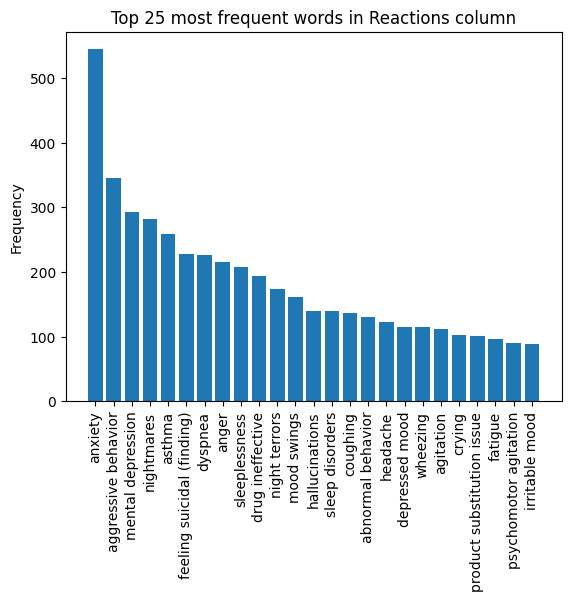

<Figure size 640x480 with 0 Axes>

In [130]:
# create a list of words from the 'Reactions' column
reactions = drugname_df['UMLS_pt'].str.lower().str.cat(sep=',')

# split the reactions by comma and semi-colon
words = reactions.split(',') + [x.strip() for x in reactions.split(';')]

# count the frequency of each word
word_counts = Counter(words)

# create a list of the top 100 words and their counts
top_words = word_counts.most_common(25)

# create a bar chart
plt.bar([x[0] for x in top_words], [x[1] for x in top_words])
plt.xticks(rotation=90)
plt.ylabel('Frequency')
plt.title('Top 25 most frequent words in Reactions column')
plt.show()
plt.savefig('top_25_reactions.png')


# 14 ACTUAT fluticasone furoate 0.1 MG/ACTUAT / vilanterol 0.025 MG/ACTUAT Dry Powder Inhaler [Breo]

In [131]:
# create a list of drug names to filter for
drug_names = ["14 ACTUAT fluticasone furoate 0.1 MG/ACTUAT / vilanterol 0.025 MG/ACTUAT Dry Powder Inhaler [Breo]"]

# filter rows where 'drugname' is in the list of drug names
drugname_df = df[df['UMLS_drugname'].isin(drug_names)]

# extract words from 'Reactions' column and tokenize them
reactions = drugname_df['UMLS_pt'].str.lower().str.cat(sep=' ')
tokens = word_tokenize(reactions)

# remove stop words and punctuation
stop_words = set(nltk.corpus.stopwords.words('english'))
tokens = [token for token in tokens if token.isalnum() and token not in stop_words]

# calculate word frequency distribution
fdist = FreqDist(tokens)

# print the top 10 most frequent words
print(fdist.most_common(10))


[('product', 915), ('drug', 876), ('dyspnea', 456), ('ineffective', 455), ('dose', 338), ('issue', 318), ('omission', 295), ('pain', 265), ('coughing', 251), ('device', 251)]


In [132]:
tokenizer = RegexpTokenizer(r'\w+')
drugname_df['tokens'] = drugname_df['UMLS_pt'].apply(lambda x: tokenizer.tokenize(x.lower()))


In [133]:
stop_words = set(stopwords.words('english'))
drugname_df['tokens'] = drugname_df['tokens'].apply(lambda x: [word for word in x if word not in stop_words])


In [134]:
fdist = FreqDist([word for tokens in drugname_df['tokens'] for word in tokens])
sorted_words = sorted(fdist.items(), key=lambda x: x[1], reverse=True)


In [135]:
for word, frequency in sorted_words[:10]:
    print(f"{word}: {frequency}")


product: 915
drug: 910
dyspnea: 456
ineffective: 455
dose: 338
issue: 318
omission: 295
pain: 265
coughing: 251
device: 251


In [136]:
for index, row in drugname_df.iterrows():
    fdist = FreqDist(row['tokens'])
    sorted_words = sorted(fdist.items(), key=lambda x: x[1], reverse=True)
    print(f"Row {index}:")
    for word, frequency in sorted_words[:10]:
        print(f"{word}: {frequency}")


Row 15528:
lymphadenopathy: 1
Row 15529:
urticaria: 1
Row 15530:
drug: 1
ineffective: 1
Row 15531:
label: 1
treatment: 1
Row 15962:
asthma: 1
Row 16667:
anxiety: 1
Row 16668:
dyspnea: 1
Row 16669:
expired: 1
product: 1
administered: 1
Row 16670:
fatigue: 1
Row 16671:
repair: 1
hip: 1
Row 17213:
dyspnea: 1
Row 17214:
feeling: 1
jittery: 1
Row 17215:
flushing: 1
Row 17216:
abnormal: 1
pulse: 1
Row 17217:
label: 1
treatment: 1
Row 19379:
abdominal: 1
discomfort: 1
Row 19380:
bronchitis: 1
Row 19381:
medical: 1
contraindication: 1
Row 19382:
urgent: 1
desire: 1
stool: 1
Row 19383:
diarrhea: 1
Row 19384:
drug: 1
administration: 1
error: 1
Row 19385:
drug: 1
ineffective: 1
Row 19386:
dyspnea: 1
Row 19387:
flatulence: 1
Row 19388:
increased: 1
frequency: 1
defecation: 1
Row 19389:
gastritis: 1
Row 19390:
gastrointestinal: 1
pain: 1
Row 19391:
hemorrhoidal: 1
hemorrhage: 1
Row 19392:
hyperchlorhydria: 1
Row 19393:
irritable: 1
bowel: 1
syndrome: 1
Row 19394:
peripheral: 1
edema: 1
Row 19395:
d

In [137]:
# create a new column to store the tokenized reactions
drugname_df['Reactions_Tokenized'] = drugname_df['UMLS_pt'].str.lower().str.split('[,;]')

# initialize a dictionary to store the word frequencies
word_freq = {}

# loop through each row of the dataframe
for row in drugname_df.itertuples():
    # loop through each tokenized word in the row
    for word in row.Reactions_Tokenized:
        # ignore stop words and single character words
        if word not in set(stopwords.words('english')) and len(word) > 1:
            # increment the word frequency count in the dictionary
            word_freq[word] = word_freq.get(word, 0) + 1

# sort the dictionary by the word frequency in descending order
sorted_word_freq = sorted(word_freq.items(), key=lambda x: x[1], reverse=True)

# print the top 10 most frequent words
for word, freq in sorted_word_freq[:1000]:
    print(f'{word}: {freq}')


drug ineffective: 450
dyspnea: 445
coughing: 251
asthma: 207
dysphonia: 207
product complaint: 193
wrong technique in device usage process: 169
product quality issue: 136
drug dose omission: 122
wheezing: 103
off-label treatment: 99
chest discomfort: 92
product dose omission issue: 92
headache: 88
dizziness: 81
disease exacerbation: 79
drug overdose: 76
product dose omission: 72
device use error: 66
malaise: 64
oropharyngeal pain: 64
underdose (unintentional): 63
tachycardia: 59
fatigue: 56
product use in unapproved indication: 56
productive cough: 54
product use issue: 53
wrong technique in product usage process: 48
nausea: 47
throat irritation: 47
chest pain: 46
candidiasis: 46
pneumonia: 46
intentional product misuse: 44
sleeplessness: 43
asthenia: 43
palpitations: 38
tremor: 36
product label confusion: 36
spasm: 35
pain: 35
ill-defined disorder: 33
underdose (intentional): 33
bronchitis: 32
exanthema: 32
nasopharyngitis: 31
rhinorrhea: 31
drug dispensing error: 31
drug action decre

In [138]:
# create a dataframe from the sorted_word_freq list
Singulair_df = pd.DataFrame(sorted_word_freq, columns=['word', 'freq'])

# save the dataframe as a CSV file
Singulair_df.to_csv('Singulair_df_word_freq.csv', index=False)

# print the top 10 most frequent words
print(Singulair_df.head(10))

                                      word  freq
0                         drug ineffective   450
1                                  dyspnea   445
2                                 coughing   251
3                                   asthma   207
4                                dysphonia   207
5                        product complaint   193
6  wrong technique in device usage process   169
7                    product quality issue   136
8                       drug dose omission   122
9                                 wheezing   103


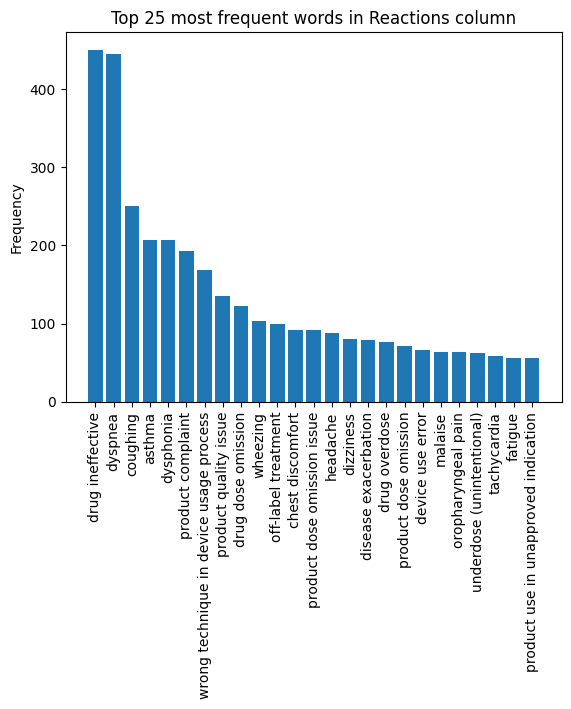

<Figure size 640x480 with 0 Axes>

In [139]:
# create a list of words from the 'Reactions' column
reactions = drugname_df['UMLS_pt'].str.lower().str.cat(sep=',')

# split the reactions by comma and semi-colon
words = reactions.split(',') + [x.strip() for x in reactions.split(';')]

# count the frequency of each word
word_counts = Counter(words)

# create a list of the top 100 words and their counts
top_words = word_counts.most_common(25)

# create a bar chart
plt.bar([x[0] for x in top_words], [x[1] for x in top_words])
plt.xticks(rotation=90)
plt.ylabel('Frequency')
plt.title('Top 25 most frequent words in Reactions column')
plt.show()
plt.savefig('top_25_reactions.png')


# NDA020983 200 ACTUAT albuterol 0.09 MG/ACTUAT Metered Dose Inhaler [Ventolin]

In [140]:
# create a list of drug names to filter for
drug_names = ["NDA020983 200 ACTUAT albuterol 0.09 MG/ACTUAT Metered Dose Inhaler [Ventolin]"]

# filter rows where 'drugname' is in the list of drug names
drugname_df = df[df['UMLS_drugname'].isin(drug_names)]

# extract words from 'Reactions' column and tokenize them
reactions = drugname_df['UMLS_pt'].str.lower().str.cat(sep=' ')
tokens = word_tokenize(reactions)

# remove stop words and punctuation
stop_words = set(nltk.corpus.stopwords.words('english'))
tokens = [token for token in tokens if token.isalnum() and token not in stop_words]

# calculate word frequency distribution
fdist = FreqDist(tokens)

# print the top 10 most frequent words
print(fdist.most_common(10))


[('product', 1848), ('drug', 915), ('device', 803), ('wrong', 761), ('error', 758), ('technique', 750), ('usage', 750), ('process', 750), ('use', 722), ('issue', 594)]


In [141]:
tokenizer = RegexpTokenizer(r'\w+')
drugname_df['tokens'] = drugname_df['UMLS_pt'].apply(lambda x: tokenizer.tokenize(x.lower()))


In [142]:
stop_words = set(stopwords.words('english'))
drugname_df['tokens'] = drugname_df['tokens'].apply(lambda x: [word for word in x if word not in stop_words])


In [143]:
fdist = FreqDist([word for tokens in drugname_df['tokens'] for word in tokens])
sorted_words = sorted(fdist.items(), key=lambda x: x[1], reverse=True)


In [144]:
for word, frequency in sorted_words[:10]:
    print(f"{word}: {frequency}")


product: 1848
drug: 919
device: 803
wrong: 761
error: 758
technique: 750
usage: 750
process: 750
use: 722
issue: 594


In [145]:
for index, row in drugname_df.iterrows():
    fdist = FreqDist(row['tokens'])
    sorted_words = sorted(fdist.items(), key=lambda x: x[1], reverse=True)
    print(f"Row {index}:")
    for word, frequency in sorted_words[:10]:
        print(f"{word}: {frequency}")


Row 699:
dizziness: 1
Row 700:
dyspnea: 1
Row 701:
joint: 1
swelling: 1
Row 702:
localized: 1
swelling: 1
Row 703:
malaise: 1
Row 704:
oxygen: 1
saturation: 1
reference: 1
range: 1
Row 705:
streptococcal: 1
sore: 1
throat: 1
Row 706:
pneumonia: 1
Row 2734:
asthma: 1
Row 2735:
drug: 1
administration: 1
error: 1
Row 2736:
hypoxia: 1
Row 2737:
presyncope: 1
Row 3061:
asthma: 1
Row 3062:
bronchospasm: 1
Row 3063:
chronic: 1
obstructive: 1
airway: 1
disease: 1
Row 3064:
dyspnea: 1
Row 3065:
hemoptysis: 1
Row 3066:
infectious: 1
lung: 1
disorder: 1
Row 3067:
productive: 1
cough: 1
Row 3068:
upper: 1
respiratory: 1
infections: 1
Row 3694:
drug: 1
overdose: 1
Row 4744:
feeling: 1
jittery: 1
Row 4745:
incorrect: 1
dose: 1
administered: 1
Row 4746:
traffic: 1
accident: 1
public: 1
road: 1
Row 4747:
somnolence: 1
Row 4822:
asthma: 1
Row 5051:
chest: 1
discomfort: 1
Row 5052:
drug: 1
ineffective: 1
Row 5215:
death: 1
finding: 1
Row 5216:
resuscitation: 1
procedure: 1
Row 5899:
product: 1
quality: 

In [146]:
# create a new column to store the tokenized reactions
drugname_df['Reactions_Tokenized'] = drugname_df['UMLS_pt'].str.lower().str.split('[,;]')

# initialize a dictionary to store the word frequencies
word_freq = {}

# loop through each row of the dataframe
for row in drugname_df.itertuples():
    # loop through each tokenized word in the row
    for word in row.Reactions_Tokenized:
        # ignore stop words and single character words
        if word not in set(stopwords.words('english')) and len(word) > 1:
            # increment the word frequency count in the dictionary
            word_freq[word] = word_freq.get(word, 0) + 1

# sort the dictionary by the word frequency in descending order
sorted_word_freq = sorted(word_freq.items(), key=lambda x: x[1], reverse=True)

# print the top 10 most frequent words
for word, freq in sorted_word_freq[:1000]:
    print(f'{word}: {freq}')


wrong technique in product usage process: 540
device use error: 514
dyspnea: 462
drug ineffective: 447
product quality issue: 393
asthma: 359
wrong technique in device usage process: 209
drug dose omission: 180
product cleaning inadequate: 178
wheezing: 127
product complaint: 124
coughing: 121
malaise: 119
underdose (unintentional): 113
expired product administered: 102
drug overdose: 99
product storage error: 89
product dose omission: 75
intentional product use issue: 73
medication error: 71
product use issue: 70
nasopharyngitis: 67
pneumonia: 65
bronchitis: 59
product use in unapproved indication: 58
chest discomfort: 47
drug administration error: 46
disease exacerbation: 37
extra dose administered: 37
inhalation therapy: 35
influenza: 33
intentional product misuse: 33
hospitalization: 32
tremor: 32
falls: 31
sinusitis: 30
chronic obstructive airway disease: 29
intentional overdose: 29
dysphonia: 27
dizziness: 26
throat irritation: 26
anxiety: 26
tachycardia: 26
incorrect dose admini

In [147]:
# create a dataframe from the sorted_word_freq list
Dulera_df = pd.DataFrame(sorted_word_freq, columns=['word', 'freq'])

# save the dataframe as a CSV file
Dulera_df.to_csv('Dulera_df_word_freq.csv', index=False)

# print the top 10 most frequent words
print(Dulera_df.head(10))

                                       word  freq
0  wrong technique in product usage process   540
1                          device use error   514
2                                   dyspnea   462
3                          drug ineffective   447
4                     product quality issue   393
5                                    asthma   359
6   wrong technique in device usage process   209
7                        drug dose omission   180
8               product cleaning inadequate   178
9                                  wheezing   127


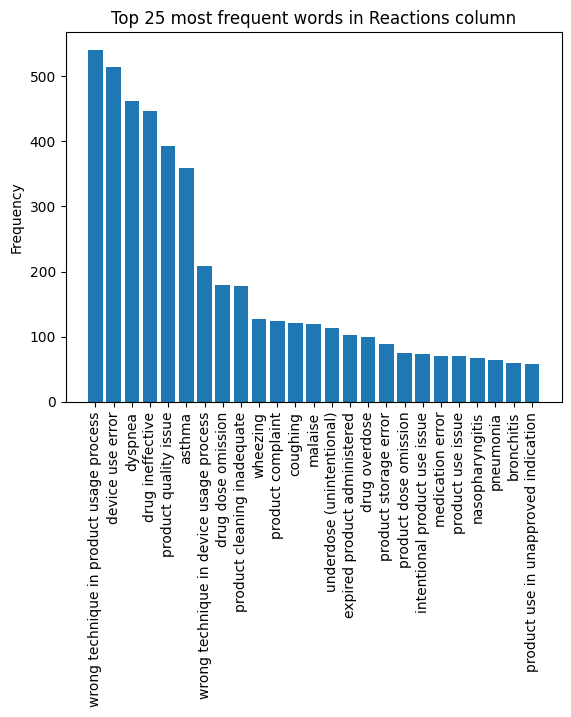

<Figure size 640x480 with 0 Axes>

In [148]:
# create a list of words from the 'Reactions' column
reactions = drugname_df['UMLS_pt'].str.lower().str.cat(sep=',')

# split the reactions by comma and semi-colon
words = reactions.split(',') + [x.strip() for x in reactions.split(';')]

# count the frequency of each word
word_counts = Counter(words)

# create a list of the top 100 words and their counts
top_words = word_counts.most_common(25)

# create a bar chart
plt.bar([x[0] for x in top_words], [x[1] for x in top_words])
plt.xticks(rotation=90)
plt.ylabel('Frequency')
plt.title('Top 25 most frequent words in Reactions column')
plt.show()
plt.savefig('top_25_reactions.png')


# Singulair

In [149]:
# create a list of drug names to filter for
drug_names = ["Singulair"]

# filter rows where 'drugname' is in the list of drug names
drugname_df = df[df['UMLS_drugname'].isin(drug_names)]

# extract words from 'Reactions' column and tokenize them
reactions = drugname_df['UMLS_pt'].str.lower().str.cat(sep=' ')
tokens = word_tokenize(reactions)

# remove stop words and punctuation
stop_words = set(nltk.corpus.stopwords.words('english'))
tokens = [token for token in tokens if token.isalnum() and token not in stop_words]

# calculate word frequency distribution
fdist = FreqDist(tokens)

# print the top 10 most frequent words
print(fdist.most_common(10))


[('behavior', 328), ('disorder', 306), ('mental', 288), ('mood', 254), ('anxiety', 236), ('drug', 234), ('finding', 221), ('feeling', 213), ('disorders', 209), ('depression', 206)]


In [150]:
tokenizer = RegexpTokenizer(r'\w+')
drugname_df['tokens'] = drugname_df['UMLS_pt'].apply(lambda x: tokenizer.tokenize(x.lower()))


In [151]:
stop_words = set(stopwords.words('english'))
drugname_df['tokens'] = drugname_df['tokens'].apply(lambda x: [word for word in x if word not in stop_words])


In [152]:
fdist = FreqDist([word for tokens in drugname_df['tokens'] for word in tokens])
sorted_words = sorted(fdist.items(), key=lambda x: x[1], reverse=True)


In [153]:
for word, frequency in sorted_words[:10]:
    print(f"{word}: {frequency}")


behavior: 328
disorder: 306
mental: 288
mood: 254
drug: 236
anxiety: 236
finding: 221
feeling: 213
disorders: 209
depression: 206


In [154]:
for index, row in drugname_df.iterrows():
    fdist = FreqDist(row['tokens'])
    sorted_words = sorted(fdist.items(), key=lambda x: x[1], reverse=True)
    print(f"Row {index}:")
    for word, frequency in sorted_words[:10]:
        print(f"{word}: {frequency}")


Row 472:
drug: 1
ineffective: 1
Row 473:
product: 1
shape: 1
issue: 1
Row 474:
chest: 1
pain: 1
Row 475:
conduction: 1
disorder: 1
heart: 1
Row 476:
tachycardia: 1
Row 477:
vomiting: 1
Row 478:
coughing: 1
Row 479:
dysphonia: 1
Row 579:
dream: 1
disorder: 1
Row 580:
aggressive: 1
behavior: 1
Row 581:
anxiety: 1
Row 582:
irritable: 1
mood: 1
Row 583:
memory: 1
impairment: 1
Row 584:
mood: 1
swings: 1
Row 585:
nervousness: 1
Row 586:
somnambulism: 1
Row 587:
speech: 1
disorders: 1
Row 628:
eosinophilic: 1
granulomatosis: 1
polyangiitis: 1
Row 724:
upper: 1
abdominal: 1
pain: 1
Row 725:
decrease: 1
appetite: 1
Row 726:
diarrhea: 1
Row 727:
sleeplessness: 1
Row 728:
restlessness: 1
Row 729:
thirst: 1
Row 730:
tremor: 1
Row 880:
abnormal: 1
behavior: 1
Row 881:
mental: 1
depression: 1
Row 882:
drug: 1
prescribing: 1
error: 1
Row 883:
morbid: 1
thoughts: 1
Row 884:
mood: 1
disorders: 1
Row 885:
anger: 1
Row 886:
crying: 1
Row 887:
mental: 1
depression: 1
Row 888:
emotional: 1
disorder: 1
Row

In [155]:
# create a new column to store the tokenized reactions
drugname_df['Reactions_Tokenized'] = drugname_df['UMLS_pt'].str.lower().str.split('[,;]')

# initialize a dictionary to store the word frequencies
word_freq = {}

# loop through each row of the dataframe
for row in drugname_df.itertuples():
    # loop through each tokenized word in the row
    for word in row.Reactions_Tokenized:
        # ignore stop words and single character words
        if word not in set(stopwords.words('english')) and len(word) > 1:
            # increment the word frequency count in the dictionary
            word_freq[word] = word_freq.get(word, 0) + 1

# sort the dictionary by the word frequency in descending order
sorted_word_freq = sorted(word_freq.items(), key=lambda x: x[1], reverse=True)

# print the top 10 most frequent words
for word, freq in sorted_word_freq[:1000]:
    print(f'{word}: {freq}')


anxiety: 219
mental depression: 204
feeling suicidal (finding): 173
aggressive behavior: 169
abnormal behavior: 128
asthma: 127
sleeplessness: 124
nightmares: 116
mood swings: 112
drug ineffective: 111
anger: 104
hallucinations: 94
dyspnea: 91
irritable mood: 79
crying: 72
fatigue: 65
headache: 63
coughing: 55
agitation: 55
pneumonia: 54
malaise: 47
night terrors: 46
disturbance of attention: 46
depressed mood: 45
obsessive-compulsive disorder: 44
adverse event: 43
dream disorder: 42
fear (mental process): 42
tremor: 41
pain in limb: 41
dizziness: 41
nausea: 39
eosinophilic granulomatosis with polyangiitis: 38
diarrhea: 37
panic attacks: 37
screaming: 37
sleep disorders: 36
upper abdominal pain: 35
emotional disorder: 34
mental disorders: 33
fever: 32
pain: 32
somnolence: 31
tic disorder: 31
feeling abnormal: 30
vomiting: 29
hypersensitivity: 29
exanthema: 29
personality change: 29
palpitations: 27
amnesia: 27
nasopharyngitis: 27
tachycardia: 26
arthralgia: 26
suicide attempt: 26
produ

In [156]:
# create a dataframe from the sorted_word_freq list
Dulera_df = pd.DataFrame(sorted_word_freq, columns=['word', 'freq'])

# save the dataframe as a CSV file
Dulera_df.to_csv('Dulera_df_word_freq.csv', index=False)

# print the top 10 most frequent words
print(Dulera_df.head(10))

                         word  freq
0                     anxiety   219
1           mental depression   204
2  feeling suicidal (finding)   173
3         aggressive behavior   169
4           abnormal behavior   128
5                      asthma   127
6               sleeplessness   124
7                  nightmares   116
8                 mood swings   112
9            drug ineffective   111


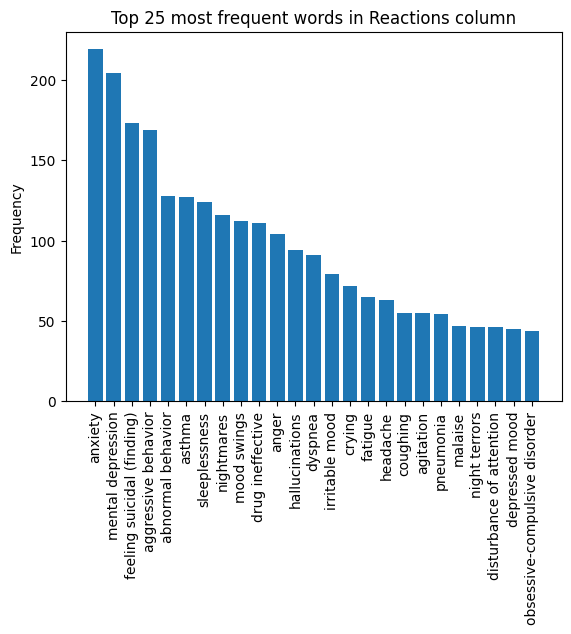

<Figure size 640x480 with 0 Axes>

In [157]:
# create a list of words from the 'Reactions' column
reactions = drugname_df['UMLS_pt'].str.lower().str.cat(sep=',')

# split the reactions by comma and semi-colon
words = reactions.split(',') + [x.strip() for x in reactions.split(';')]

# count the frequency of each word
word_counts = Counter(words)

# create a list of the top 100 words and their counts
top_words = word_counts.most_common(25)

# create a bar chart
plt.bar([x[0] for x in top_words], [x[1] for x in top_words])
plt.xticks(rotation=90)
plt.ylabel('Frequency')
plt.title('Top 25 most frequent words in Reactions column')
plt.show()
plt.savefig('top_25_reactions.png')


# Dulera

In [158]:
# create a list of drug names to filter for
drug_names = ["Dulera"]

# filter rows where 'drugname' is in the list of drug names
drugname_df = df[df['UMLS_drugname'].isin(drug_names)]

# extract words from 'Reactions' column and tokenize them
reactions = drugname_df['UMLS_pt'].str.lower().str.cat(sep=' ')
tokens = word_tokenize(reactions)

# remove stop words and punctuation
stop_words = set(nltk.corpus.stopwords.words('english'))
tokens = [token for token in tokens if token.isalnum() and token not in stop_words]

# calculate word frequency distribution
fdist = FreqDist(tokens)

# print the top 10 most frequent words
print(fdist.most_common(10))


[('product', 1332), ('issue', 1051), ('quality', 1009), ('dose', 786), ('drug', 730), ('omission', 621), ('device', 469), ('dyspnea', 444), ('poor', 275), ('used', 252)]


In [159]:
tokenizer = RegexpTokenizer(r'\w+')
drugname_df['tokens'] = drugname_df['UMLS_pt'].apply(lambda x: tokenizer.tokenize(x.lower()))


In [160]:
stop_words = set(stopwords.words('english'))
drugname_df['tokens'] = drugname_df['tokens'].apply(lambda x: [word for word in x if word not in stop_words])


In [161]:
fdist = FreqDist([word for tokens in drugname_df['tokens'] for word in tokens])
sorted_words = sorted(fdist.items(), key=lambda x: x[1], reverse=True)


In [162]:
for word, frequency in sorted_words[:10]:
    print(f"{word}: {frequency}")


product: 1332
issue: 1051
quality: 1009
dose: 786
drug: 730
omission: 621
device: 469
dyspnea: 444
poor: 275
used: 252


In [163]:
for index, row in drugname_df.iterrows():
    fdist = FreqDist(row['tokens'])
    sorted_words = sorted(fdist.items(), key=lambda x: x[1], reverse=True)
    print(f"Row {index}:")
    for word, frequency in sorted_words[:10]:
        print(f"{word}: {frequency}")


Row 403:
adverse: 1
event: 1
Row 404:
product: 1
quality: 1
issue: 1
Row 471:
myalgia: 1
Row 518:
streptococcal: 1
sore: 1
throat: 1
Row 535:
chest: 1
pain: 1
Row 536:
exanthema: 1
Row 539:
chest: 1
discomfort: 1
Row 540:
dyspnea: 1
Row 541:
inappropriate: 1
schedule: 1
drug: 1
administration: 1
Row 542:
lung: 1
hyperinflation: 1
Row 543:
device: 1
malfunction: 1
Row 544:
incorrect: 1
dose: 1
administered: 1
Row 545:
drug: 1
ineffective: 1
Row 546:
product: 1
quality: 1
issue: 1
Row 574:
anxiety: 1
Row 600:
coughing: 1
Row 601:
xerostomia: 1
Row 602:
product: 1
quality: 1
issue: 1
Row 607:
increase: 1
blood: 1
pressure: 1
Row 608:
drug: 1
dose: 1
omission: 1
Row 609:
expired: 1
drug: 1
administered: 1
Row 618:
muscle: 1
rigidity: 1
Row 625:
drug: 1
dose: 1
omission: 1
Row 626:
incorrect: 1
dose: 1
administered: 1
Row 627:
product: 1
quality: 1
issue: 1
Row 656:
oropharyngeal: 1
pain: 1
Row 736:
drug: 1
dose: 1
omission: 1
Row 737:
dyspnea: 1
Row 738:
drug: 1
overdose: 1
Row 739:
produc

In [164]:
# create a new column to store the tokenized reactions
drugname_df['Reactions_Tokenized'] = drugname_df['UMLS_pt'].str.lower().str.split('[,;]')

# initialize a dictionary to store the word frequencies
word_freq = {}

# loop through each row of the dataframe
for row in drugname_df.itertuples():
    # loop through each tokenized word in the row
    for word in row.Reactions_Tokenized:
        # ignore stop words and single character words
        if word not in set(stopwords.words('english')) and len(word) > 1:
            # increment the word frequency count in the dictionary
            word_freq[word] = word_freq.get(word, 0) + 1

# sort the dictionary by the word frequency in descending order
sorted_word_freq = sorted(word_freq.items(), key=lambda x: x[1], reverse=True)

# print the top 10 most frequent words
for word, freq in sorted_word_freq[:1000]:
    print(f'{word}: {freq}')


product quality issue: 733
dyspnea: 433
drug dose omission: 433
poor quality device used: 251
coughing: 198
no adverse event: 183
asthma: 169
device malfunction: 156
incorrect dose administered: 150
drug ineffective: 133
wheezing: 113
product dose omission issue: 100
product container issue: 96
underdose (unintentional): 90
chest discomfort: 87
product dose omission: 86
dysphonia: 78
headache: 64
product use issue: 57
circumstance or information capable of leading to medication error: 49
oropharyngeal pain: 43
chest pain: 41
dizziness: 41
wrong technique in product usage process: 41
inappropriate schedule of drug administration: 40
tremor: 38
wrong technique in device usage process: 38
fatigue: 37
malaise: 36
spasm: 35
tachycardia: 32
anxiety: 28
drug administered to patient of inappropriate age: 28
candidiasis: 28
feeling abnormal: 28
palpitations: 28
expired product administered: 28
nervousness: 27
nasopharyngitis: 24
aphonia: 23
pneumonia: 23
throat irritation: 23
adverse event: 22


In [165]:
# create a dataframe from the sorted_word_freq list
Dulera_df = pd.DataFrame(sorted_word_freq, columns=['word', 'freq'])

# save the dataframe as a CSV file
Dulera_df.to_csv('Dulera_df_word_freq.csv', index=False)

# print the top 10 most frequent words
print(Dulera_df.head(10))

                          word  freq
0        product quality issue   733
1                      dyspnea   433
2           drug dose omission   433
3     poor quality device used   251
4                     coughing   198
5             no adverse event   183
6                       asthma   169
7           device malfunction   156
8  incorrect dose administered   150
9             drug ineffective   133


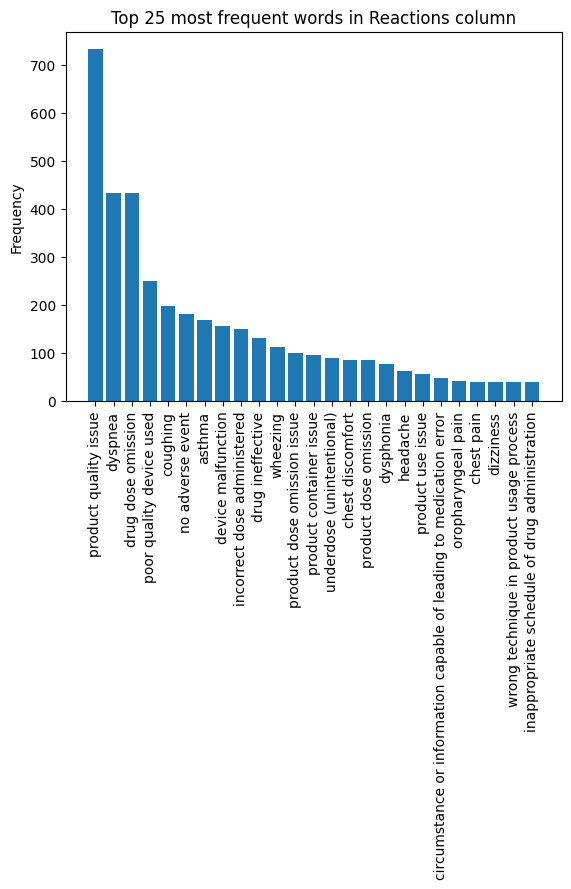

<Figure size 640x480 with 0 Axes>

In [166]:
# create a list of words from the 'Reactions' column
reactions = drugname_df['UMLS_pt'].str.lower().str.cat(sep=',')

# split the reactions by comma and semi-colon
words = reactions.split(',') + [x.strip() for x in reactions.split(';')]

# count the frequency of each word
word_counts = Counter(words)

# create a list of the top 100 words and their counts
top_words = word_counts.most_common(25)

# create a bar chart
plt.bar([x[0] for x in top_words], [x[1] for x in top_words])
plt.xticks(rotation=90)
plt.ylabel('Frequency')
plt.title('Top 25 most frequent words in Reactions column')
plt.show()
plt.savefig('top_25_reactions.png')
